In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = ["BAL_Cat_Turnbull blue_1.svs", 
                         "BAL_Cat_Turnbull blue_6.svs", 
                         "BAL_Cat_Turnbull blue_14.svs", 
                         "BAL_Cat_Turnbull blue_13.svs", 
                         "BAL_Cat_Turnbull blue_2.svs", ]

slides_val = list(set(["BAL_Cat_Turnbull blue_12.svs", "BAL_Cat_Turnbull blue_10.svs"]))

In [7]:
grade_list = [0, 1]
annotations_path = Path("../../Statistics/EIPH_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)
annotations["image_name"] = [name.replace("tiff","svs") for name in annotations["image_name"]]
annotations = annotations[annotations["grade"].isin(grade_list)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,unique_identifier,user_id,deleted,last_editor,data_set_name,version
554802,1049539,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 9903.0, 'x2': 10029.0, 'y1': 5508.0, 'y...",875aab61-3f1f-429a-a053-f87aba6c99da,1,False,1,SDATA,Inference
554803,1049540,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 26435.0, 'x2': 26544.0, 'y1': 24003.0, ...",37e8ad72-ba58-4608-aeab-cfdf004d1f00,1,False,1,SDATA,Inference
554804,1049542,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 18462.0, 'x2': 18588.0, 'y1': 10556.0, ...",37f441f4-39ec-478c-9718-c04c4a11c914,1,False,1,SDATA,Inference
554805,1049545,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 23213.0, 'x2': 23359.0, 'y1': 5401.0, '...",74862e27-5881-41d8-90f3-5eb305d35e41,1,True,1,SDATA,Cluster
554806,1049548,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 12243.0, 'x2': 12375.0, 'y1': 14740.0, ...",d718f087-7a46-4e22-8610-ba5f82d04818,1,False,1,SDATA,Inference


In [8]:
slides_path = Path("../../../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs")  if slide.name in slides_train + slides_val}
files

{'BAL_Cat_Turnbull blue_1.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_1.svs'),
 'BAL_Cat_Turnbull blue_10.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_10.svs'),
 'BAL_Cat_Turnbull blue_12.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_12.svs'),
 'BAL_Cat_Turnbull blue_13.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_13.svs'),
 'BAL_Cat_Turnbull blue_14.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_14.svs'),
 'BAL_Cat_Turnbull blue_2.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_2.svs'),
 'BAL_Cat_Turnbull blue_6.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_6.svs')}

In [9]:
size = 1024 
level = 0
bs = 16
train_images = 2500
val_images = 1500
experiment_name = "CatVsCat"

In [10]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [11]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.5, resolved={}, do_run=True, is_random=True, use_on_y=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True, use_on_y=True)])

In [12]:
def get_y_func(x):
    return x.y

In [13]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate).normalize() #, num_workers=0

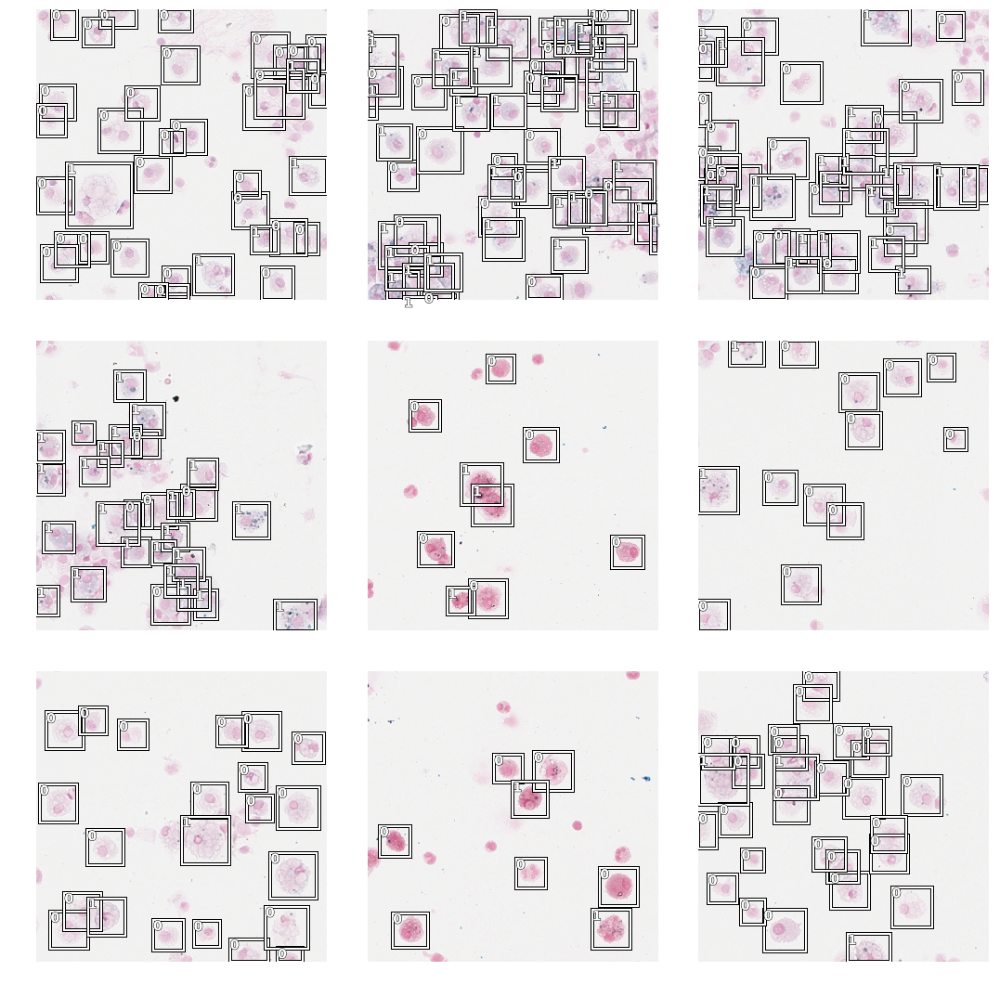

In [14]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

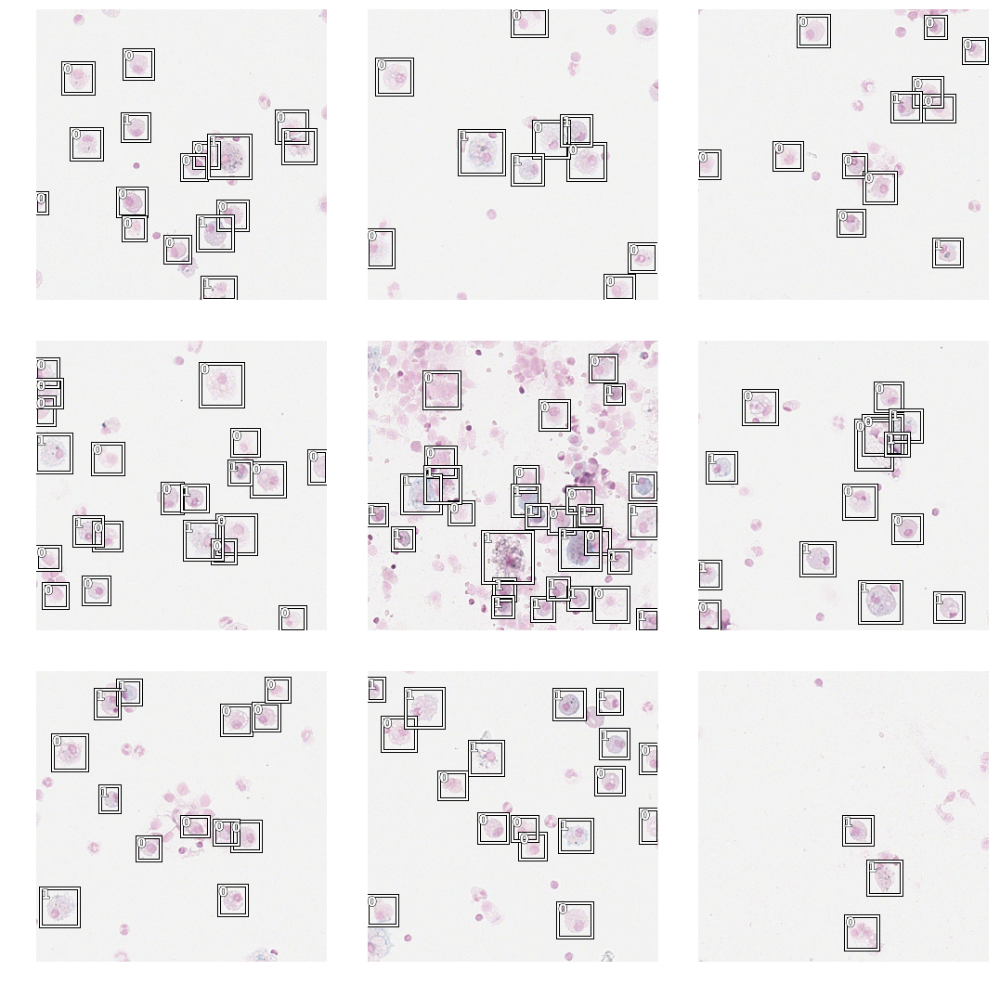

In [15]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [16]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.6, 0.7, 0.9, 1.25, 1.5])

In [17]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=5, sizes=[32], chs=128, final_bias=-4., n_conv=3)

In [18]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, partial(CSVLogger, append=False, filename=experiment_name)], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [19]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [20]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,time
0,0.428803,0.327431,0.724780,0.096456,0.230975,0.607541,0.842020,09:18
1,0.259290,0.330723,0.781514,0.097306,0.233417,0.744097,0.818930,08:26
2,0.212581,0.222953,0.839327,0.066687,0.156265,0.863478,0.815176,09:42
3,0.192643,0.191697,0.856216,0.058623,0.133074,0.884412,0.828020,10:14
4,0.186401,0.200996,0.855386,0.063505,0.137492,0.838445,0.872328,08:57
5,0.165263,0.186621,0.868329,0.042210,0.144411,0.808724,0.927935,09:31
6,0.148669,0.175957,0.826512,0.036752,0.139205,0.725240,0.927783,08:25
7,0.132647,0.138947,0.891732,0.033969,0.104979,0.847800,0.935663,08:15
8,0.123840,0.120400,0.909271,0.030510,0.089890,0.893538,0.925004,08:51
9,0.117577,0.121438,0.900104,0.031271,0.090167,0.917583,0.882625,06:37


In [21]:
import pickle

stats = {"anchors": anchors,
         "mean": to_np(data.stats[0]),
         "std": to_np(data.stats[1]),
         "size": size,
         "n_classes": 6,
         "n_anchors": 5,
         "sizes": [32],
         "chs": 128,
         "encoder": "RN-18",
         "n_conv": 3,
         "level": 0,
         "model": get_model(learn.model).state_dict()
        }

torch.save(stats, "{}.p".format(experiment_name))

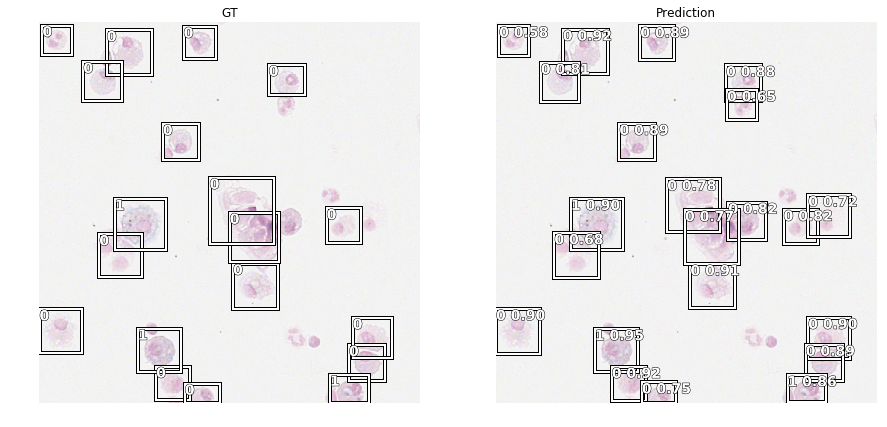

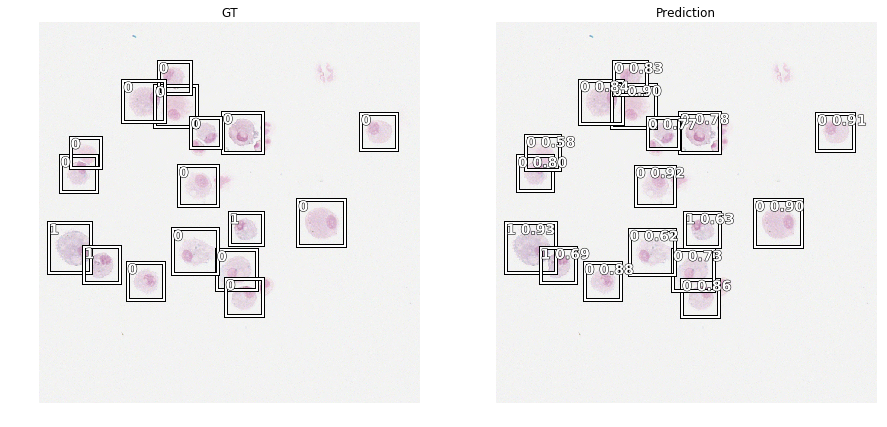

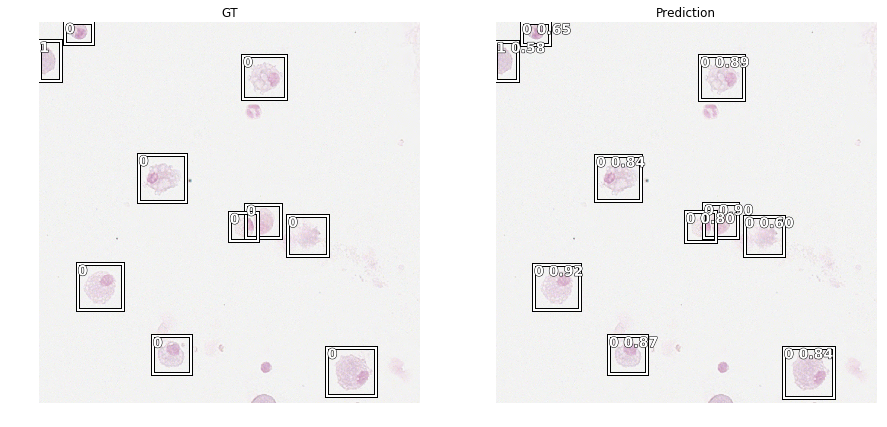

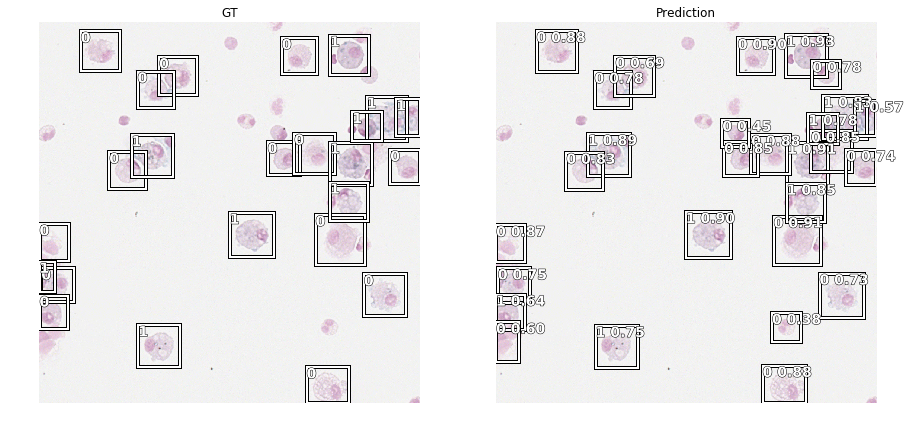

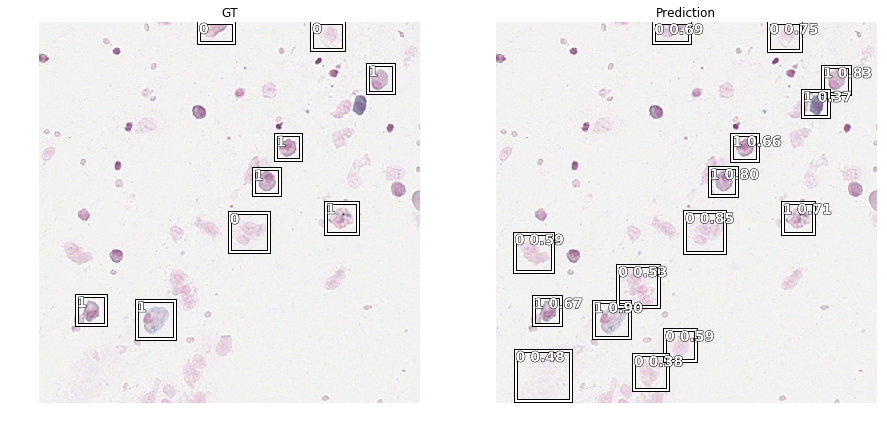

...

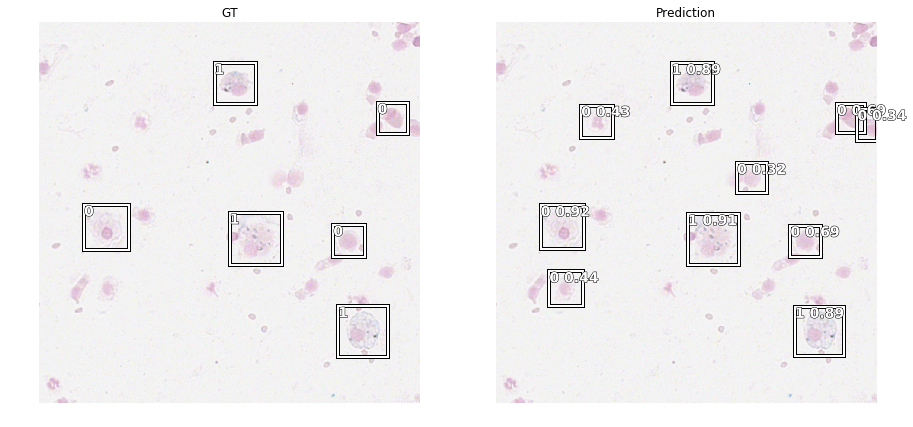

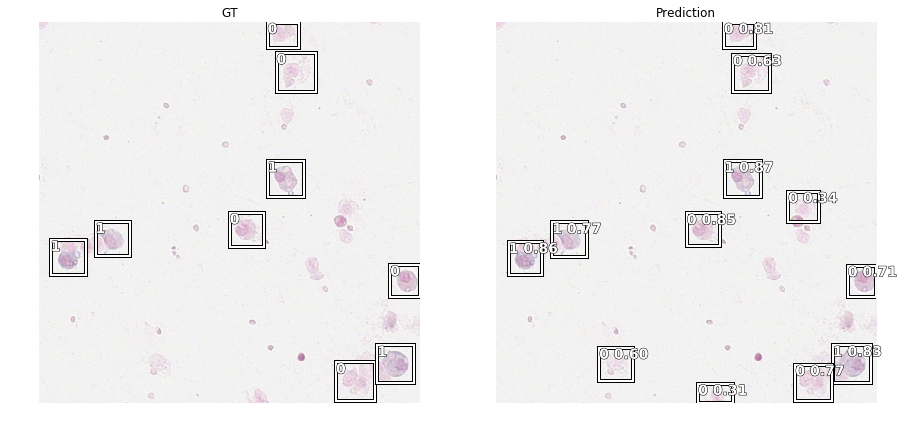

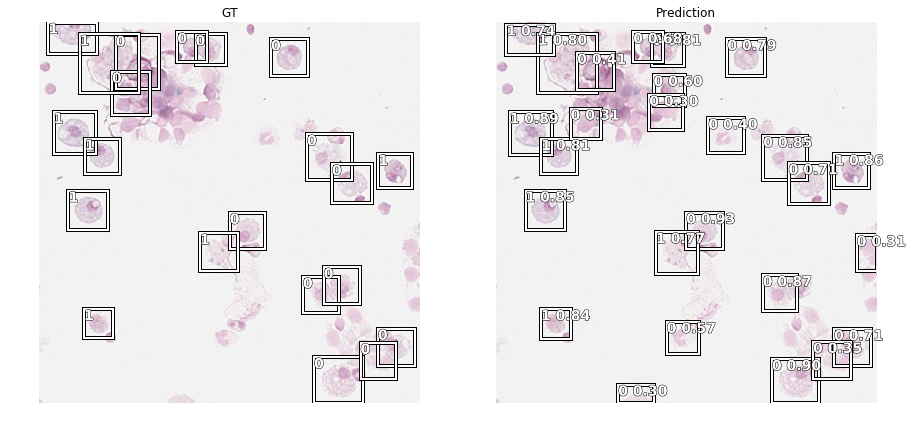

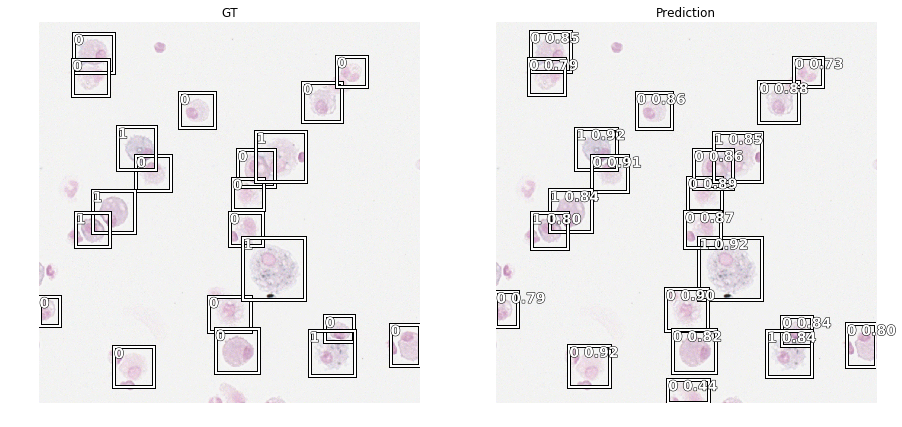

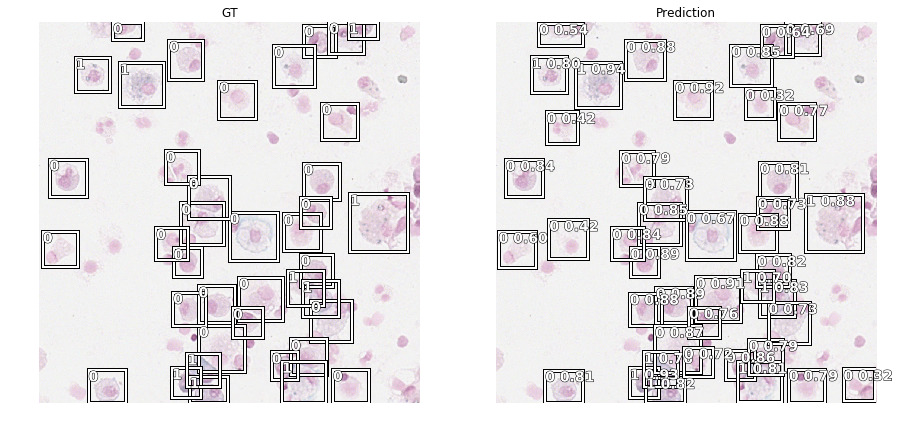

In [22]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=20)